# Inspect the single-lineage model run on the colorectal data (004)

Model attributes:

- sgRNA | gene varying intercept
- RNA and CN varying effects per gene
- correlation between gene varying effects modeled using the multivariate normal and Cholesky decomposition (non-centered parameterization)
- target gene mutation variable and cancer gene comutation variable.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from time import time

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import Markdown, display

In [3]:
from speclet.analysis.arviz_analysis import extract_coords_param_names
from speclet.bayesian_models.lineage_hierarchical_nb import LineageHierNegBinomModel
from speclet.data_processing.common import head_tail
from speclet.io import modeling_data_dir, models_dir
from speclet.managers.data_managers import CrisprScreenDataManager
from speclet.plot import set_speclet_theme
from speclet.project_configuration import arviz_config

In [4]:
# Notebook execution timer.
notebook_tic = time()

# Plotting setup.
set_speclet_theme()
%config InlineBackend.figure_format = "retina"
arviz_config()

## Data

In [5]:
saved_model_dir = models_dir() / "hnb-single-lineage-colorectal-004_PYMC_NUMPYRO"

In [6]:
with open(saved_model_dir / "description.txt") as f:
    model_description = "".join(list(f))

print(model_description)

name: 'hnb-single-lineage-colorectal-004'
fit method: 'PYMC_NUMPYRO'

--------------------------------------------------------------------------------

CONFIGURATION

{
    "name": "hnb-single-lineage-colorectal-004",
    "description": " Single lineage hierarchical negative binomial model for colorectal data from the Broad. ",
    "active": true,
    "model": "LINEAGE_HIERARCHICAL_NB",
    "data_file": "modeling_data/lineage-modeling-data/depmap-modeling-data_colorectal.csv",
    "model_kwargs": {
        "lineage": "colorectal"
    },
    "sampling_kwargs": {
        "pymc_mcmc": null,
        "pymc_advi": null,
        "pymc_numpyro": {
            "draws": 1000,
            "tune": 1000,
            "chains": 4,
            "target_accept": 0.98,
            "progress_bar": true,
            "chain_method": "parallel",
            "postprocessing_backend": "cpu",
            "idata_kwargs": {
                "log_likelihood": false
            },
            "nuts_kwargs": {
      

### Load posterior summary

In [7]:
crc_post_summary = pd.read_csv(saved_model_dir / "posterior-summary.csv").assign(
    var_name=lambda d: [x.split("[")[0] for x in d["parameter"]]
)
crc_post_summary.head()

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
0,mu_mu_a,0.121,0.002,0.117,0.123,0.001,0.001,6.0,31.0,1.67,mu_mu_a
1,mu_b,-0.000,0.001,-0.001,0.001,0.000,0.000,7.0,28.0,1.63,mu_b
2,mu_d,-0.022,0.001,-0.022,-0.020,0.000,0.000,7.0,31.0,1.54,mu_d
3,sigma_a,0.164,0.034,0.104,0.185,0.017,0.013,6.0,11.0,1.85,sigma_a
4,alpha,8.121,0.719,6.870,8.560,0.358,0.274,5.0,11.0,2.13,alpha


### Load trace object

In [8]:
trace_file = saved_model_dir / "posterior.netcdf"
assert trace_file.exists()
trace = az.from_netcdf(trace_file)

### Colorectal data

In [9]:
def _broad_only(df: pd.DataFrame) -> pd.DataFrame:
    return df[df["screen"] == "broad"].reset_index(drop=True)


crc_dm = CrisprScreenDataManager(
    modeling_data_dir()
    / "lineage-modeling-data"
    / "depmap-modeling-data_colorectal.csv",
    transformations=[_broad_only],
)

In [10]:
crc_data = crc_dm.get_data(read_kwargs={"low_memory": False})
crc_data.head()

,sgrna,replicate_id,lfc,p_dna_batch,genome_alignment,hugo_symbol,screen,multiple_hits_on_gene,sgrna_target_chr,sgrna_target_pos,...,any_deleterious,any_tcga_hotspot,any_cosmic_hotspot,is_mutated,copy_number,lineage,lineage_subtype,primary_or_metastasis,is_male,age
0,AAAGCCCAGGAGTATGGGAG,LS513-311Cas9_RepA_p6_batch2,0.594321,2,chr2_130522105_-,CFC1B,broad,True,2,130522105,...,NaN,NaN,NaN,False,0.951337,colorectal,colorectal_adenocarcinoma,primary,True,63.0
1,AAATCAGAGAAACCTGAACG,LS513-311Cas9_RepA_p6_batch2,-0.363633,2,chr11_89916950_-,TRIM49D1,broad,True,11,89916950,...,NaN,NaN,NaN,False,0.945508,colorectal,colorectal_adenocarcinoma,primary,True,63.0
2,AACGTCTTTGAAGAAAGCTG,LS513-311Cas9_RepA_p6_batch2,-0.001343,2,chr5_71055421_-,GTF2H2,broad,True,5,71055421,...,NaN,NaN,NaN,False,1.428663,colorectal,colorectal_adenocarcinoma,primary,True,63.0
3,AACGTCTTTGAAGGAAGCTG,LS513-311Cas9_RepA_p6_batch2,0.367220,2,chr5_69572480_+,GTF2H2C,broad,True,5,69572480,...,NaN,NaN,NaN,False,1.428663,colorectal,colorectal_adenocarcinoma,primary,True,63.0
4,AAGAGGTTCCAGACTACTTA,LS513-311Cas9_RepA_p6_batch2,-1.180029,2,chrX_155898173_+,VAMP7,broad,True,X,155898173,...,NaN,NaN,NaN,False,0.466222,colorectal,colorectal_adenocarcinoma,primary,True,63.0


### Single lineage model

In [11]:
crc_model = LineageHierNegBinomModel(lineage="colorectal")

In [12]:
valid_crc_data = crc_model.data_processing_pipeline(crc_data.copy())
crc_model_data = crc_model.make_data_structure(valid_crc_data)

[08/01/22 06:39:38] INFO     Processing data for modeling.     ]8;id=624563;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=730236;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#269\269]8;;\

                    INFO     LFC limits: (-5.0, 5.0)           ]8;id=610852;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=525779;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#270\270]8;;\

[08/01/22 06:41:27] WARNING  number of data points dropped: 25 ]8;id=183296;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=159206;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#321\321]8;;\

[08/01/22 06:41:30] INFO     number of genes mutated in all    ]8;id=212128;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=399995;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#478\478]8;;\
                             cells lines: 0                                                  

[08/01/22 06:41:33] INFO     Dropping 4 cancer genes.          ]8;id=143234;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=990614;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#534\534]8;;\

## Analysis

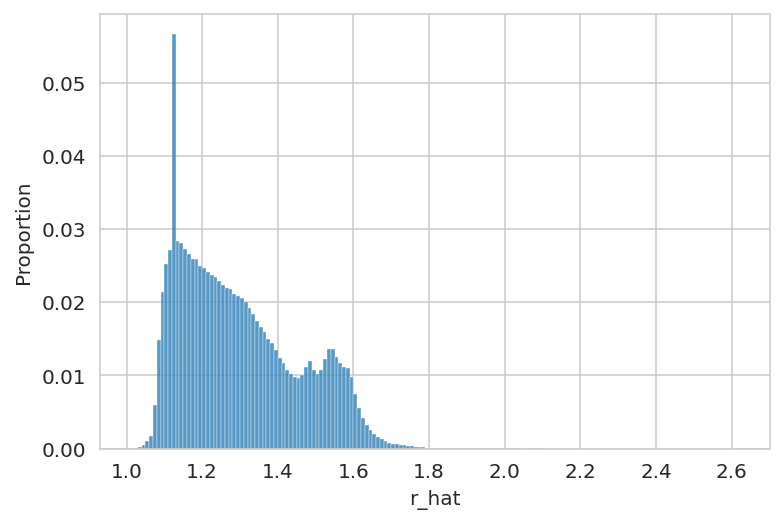

In [13]:
sns.histplot(x=crc_post_summary["r_hat"], binwidth=0.01, stat="proportion");

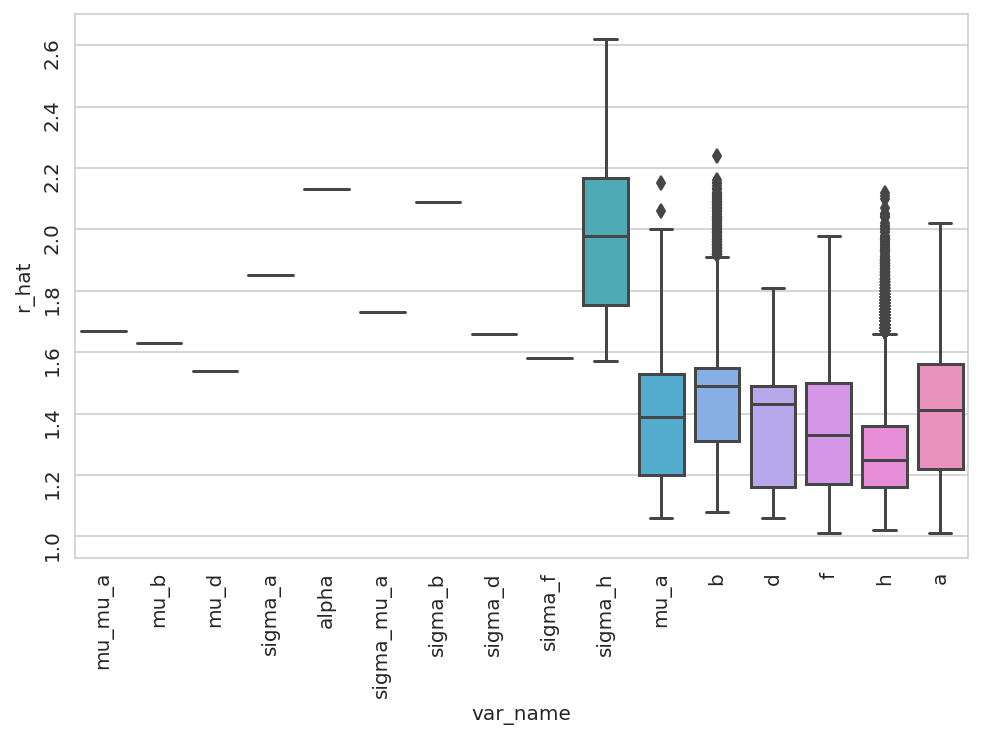

In [14]:
fig, ax = plt.subplots(figsize=(8, 5))
sns.boxplot(data=crc_post_summary, x="var_name", y="r_hat", ax=ax)
ax.tick_params(rotation=90)
plt.show()

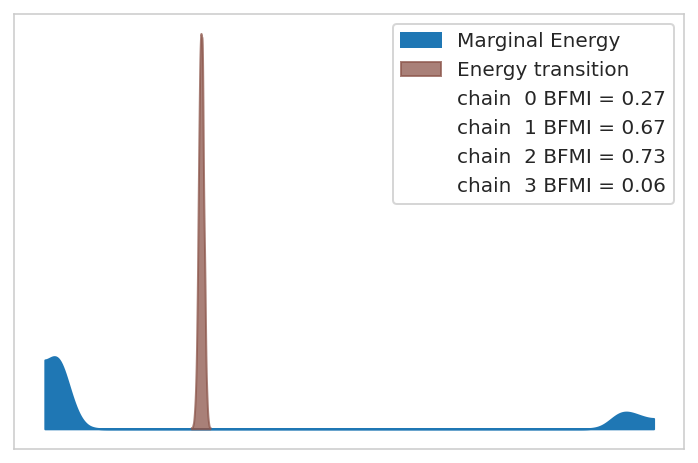

In [15]:
az.plot_energy(trace);

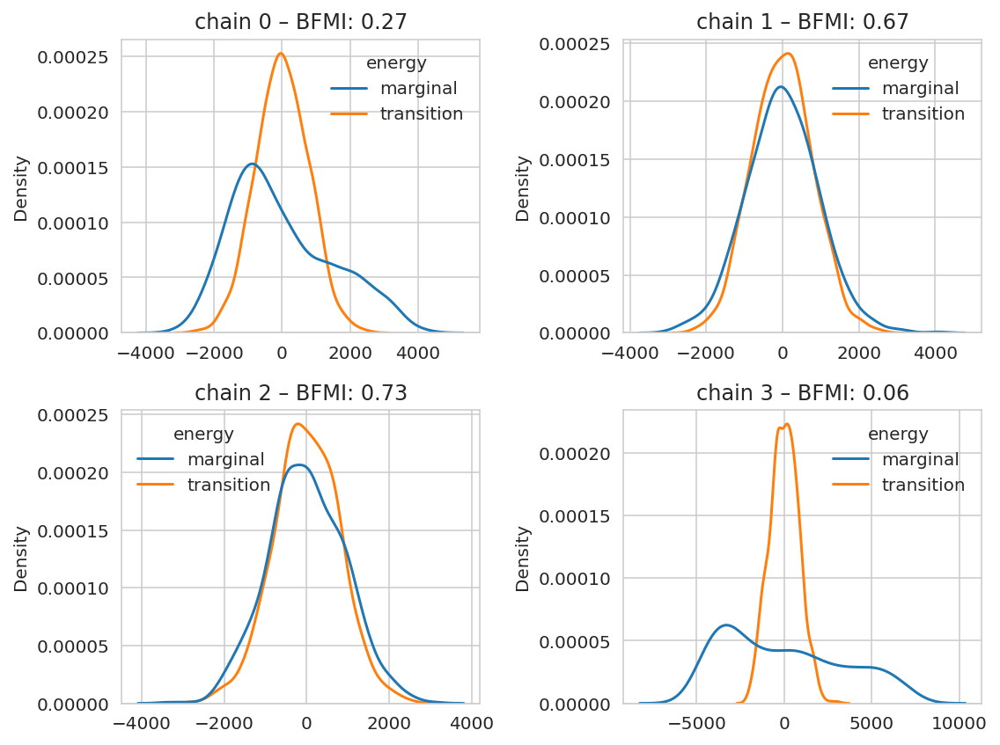

In [16]:
energy = trace.sample_stats.energy.values
marginal_e = pd.DataFrame((energy - energy.mean(axis=1)[:, None]).T).assign(
    energy="marginal"
)
transition_e = pd.DataFrame((energy[:, :-1] - energy[:, 1:]).T).assign(
    energy="transition"
)
energy_df = pd.concat([marginal_e, transition_e]).reset_index(drop=True)
bfmi = az.bfmi(trace)

fig, axes = plt.subplots(2, 2, figsize=(8, 6))
for i, ax in enumerate(axes.flatten()):
    sns.kdeplot(data=energy_df, x=i, hue="energy", ax=ax)
    ax.set_title(f"chain {i} – BFMI: {bfmi[i]:0.2f}")
    ax.set_xlabel(None)
    xmin, _ = ax.get_xlim()
    _, ymax = ax.get_ylim()
    ax.get_legend().set_frame_on(False)

fig.tight_layout()
plt.show()

In [17]:
stats = ["step_size", "n_steps", "tree_depth", "acceptance_rate", "energy"]
trace.sample_stats.get(stats).to_dataframe().groupby("chain").mean()

,step_size,n_steps,tree_depth,acceptance_rate,energy
chain,,,,,
0,0.000895,1023.0,10.0,0.989053,1.959877e+07
1,0.003200,1023.0,10.0,0.949941,1.959561e+07
2,0.002993,1023.0,10.0,0.973475,1.959566e+07
3,0.000165,1023.0,10.0,0.692344,1.977465e+07


In [18]:
HAPPY_CHAINS = [1, 2]
SAD_CHAINS = [0, 3]

In [19]:
trace.posterior = trace.posterior.sel({"chain": HAPPY_CHAINS})
trace.posterior_predictive = trace.posterior_predictive.sel({"chain": HAPPY_CHAINS})

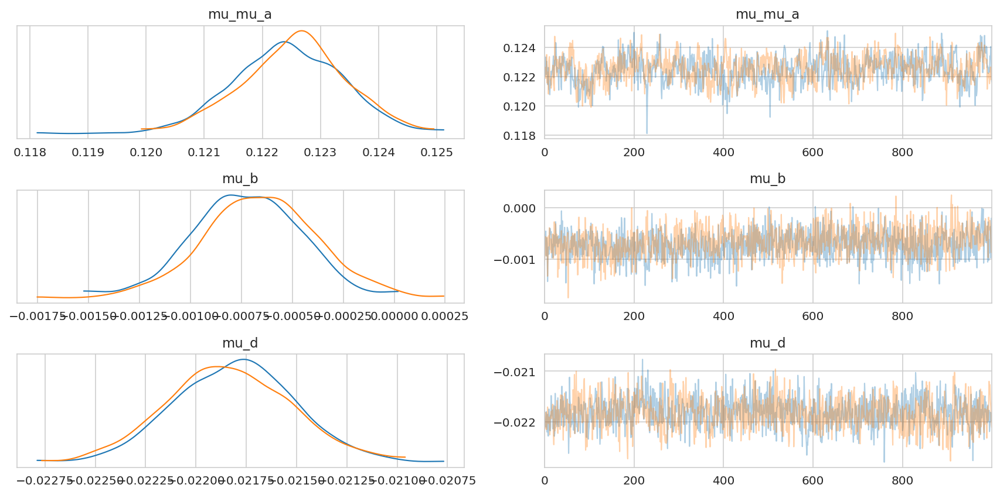

In [20]:
az.plot_trace(trace, var_names=["mu_mu_a", "mu_b", "mu_d"], compact=False)
plt.tight_layout()

In [21]:
az.summary(trace, var_names=["mu_mu_a", "mu_b", "mu_d"])

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu_mu_a,0.122,0.001,0.121,0.124,0.0,0.0,298.0,661.0,1.01
mu_b,-0.001,0.000,-0.001,-0.000,0.0,0.0,90.0,1487.0,1.03
mu_d,-0.022,0.000,-0.022,-0.021,0.0,0.0,750.0,1372.0,1.00


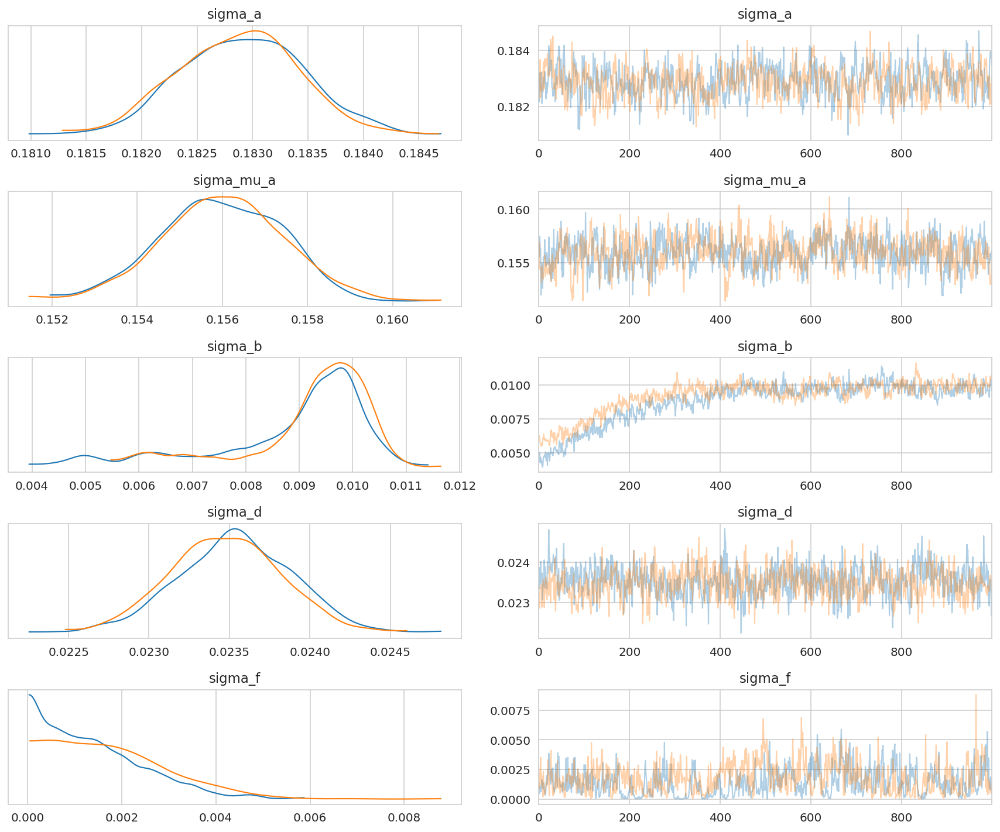

In [22]:
az.plot_trace(
    trace, var_names=[f"sigma_{x}" for x in ["a", "mu_a", "b", "d", "f"]], compact=False
)
plt.tight_layout()
plt.show()

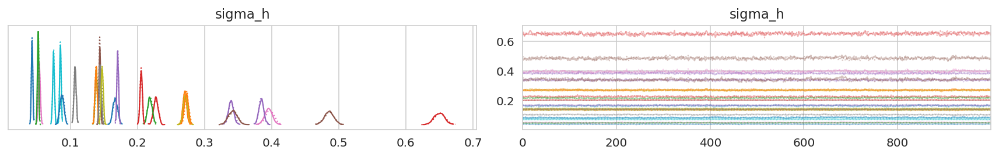

In [23]:
az.plot_trace(trace, var_names=["sigma_h"], compact=True)
plt.tight_layout()
plt.show()

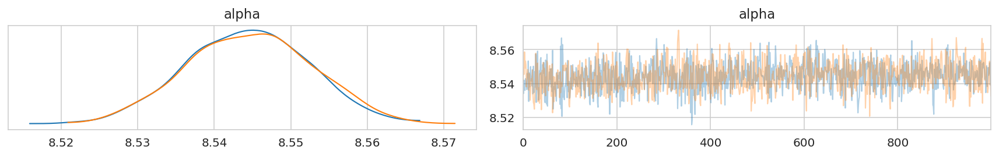

In [24]:
az.plot_trace(trace, var_names=["alpha"], compact=False)
plt.tight_layout()
plt.show()

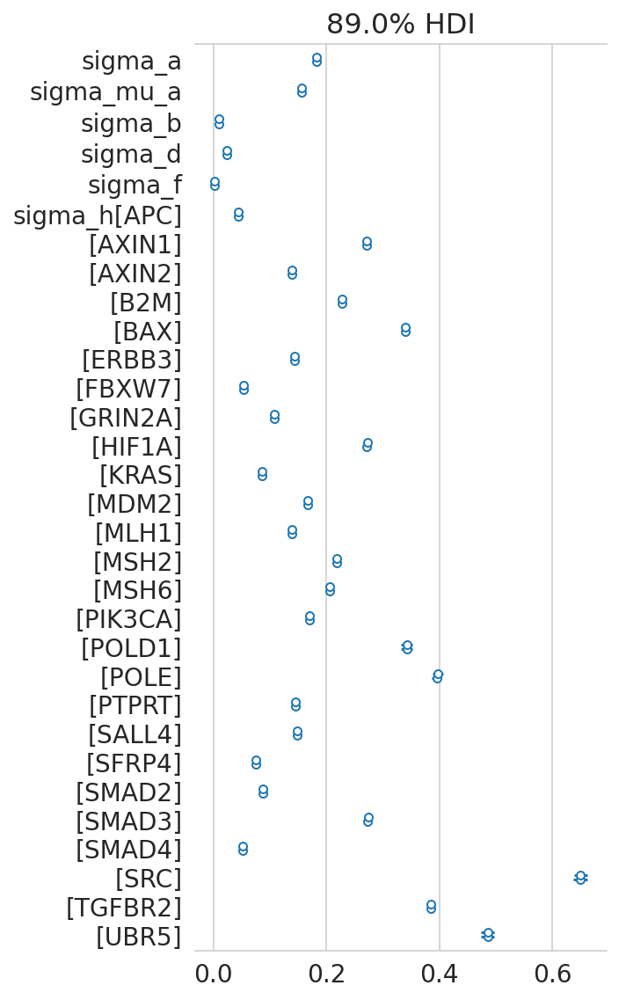

In [25]:
az.plot_forest(
    trace, var_names=["^sigma_*"], filter_vars="regex", combined=False, figsize=(5, 8)
)
plt.tight_layout()

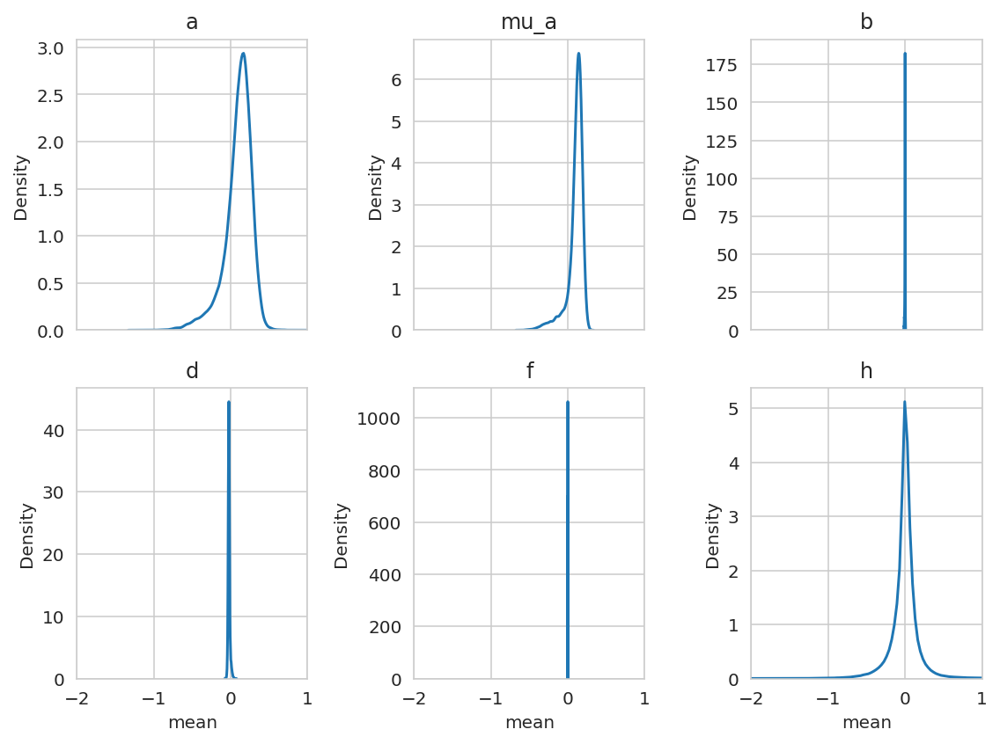

In [26]:
var_names = ["a", "mu_a", "b", "d", "f", "h"]
_, axes = plt.subplots(2, 3, figsize=(8, 6), sharex=True)
for ax, var_name in zip(axes.flatten(), var_names):
    x = crc_post_summary.query(f"var_name == '{var_name}'")["mean"]
    sns.kdeplot(x=x, ax=ax)
    ax.set_title(var_name)
    ax.set_xlim(-2, 1)

plt.tight_layout()
plt.show()

In [27]:
sgrna_to_gene_map = (
    crc_data.copy()[["hugo_symbol", "sgrna"]].drop_duplicates().reset_index(drop=True)
)

In [28]:
crc_post_summary.query("var_name == 'mu_a'").sort_values("mean").pipe(head_tail, 5)

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
12677,mu_a[RAN],-0.630,0.441,-0.963,0.118,0.217,0.166,6.0,27.0,1.72,mu_a
14927,mu_a[SRSF3],-0.569,0.401,-0.865,0.118,0.198,0.151,7.0,26.0,1.64,mu_a
13533,mu_a[SARS],-0.559,0.395,-0.850,0.118,0.195,0.149,7.0,27.0,1.62,mu_a
13339,mu_a[RPSA],-0.554,0.394,-0.851,0.118,0.194,0.149,6.0,26.0,1.69,mu_a
13356,mu_a[RRM1],-0.544,0.386,-0.831,0.118,0.191,0.146,7.0,27.0,1.58,mu_a
13194,mu_a[ROCK2],0.279,0.111,0.117,0.400,0.050,0.038,6.0,34.0,1.66,mu_a
16424,mu_a[TRIQK],0.283,0.105,0.117,0.389,0.048,0.036,7.0,25.0,1.55,mu_a
10489,mu_a[OFD1],0.285,0.107,0.117,0.396,0.049,0.037,7.0,24.0,1.58,mu_a
13021,mu_a[RIC8A],0.287,0.111,0.117,0.402,0.050,0.038,7.0,24.0,1.62,mu_a
8175,mu_a[LAMP2],0.289,0.109,0.117,0.404,0.050,0.038,7.0,23.0,1.60,mu_a


In [29]:
crc_post_summary.query("var_name == 'b'").sort_values("mean").pipe(head_tail, 5)

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
18823,b[ANKLE2],-0.021,0.017,-0.041,0.001,0.008,0.006,5.0,31.0,2.12,b
31960,b[SF1],-0.021,0.017,-0.042,0.001,0.008,0.006,5.0,32.0,2.14,b
29987,b[POLR3A],-0.020,0.016,-0.041,0.001,0.008,0.006,5.0,28.0,2.13,b
21618,b[CRCP],-0.019,0.015,-0.038,0.002,0.007,0.005,5.0,28.0,2.13,b
31301,b[RNGTT],-0.019,0.014,-0.037,0.000,0.007,0.005,5.0,15.0,2.09,b
19209,b[ARSH],0.007,0.008,-0.002,0.019,0.003,0.002,8.0,52.0,1.41,b
23279,b[FAM199X],0.007,0.007,-0.001,0.018,0.003,0.002,9.0,48.0,1.36,b
19419,b[ATP8B1],0.007,0.008,-0.002,0.020,0.003,0.002,8.0,93.0,1.43,b
28478,b[NUAK2],0.007,0.008,-0.002,0.019,0.003,0.002,7.0,48.0,1.61,b
36252,b[ZSCAN9],0.007,0.008,-0.002,0.020,0.003,0.002,8.0,36.0,1.49,b


In [30]:
crc_post_summary.query("var_name == 'd'").sort_values("mean").pipe(head_tail, 5)

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
38711,d[CCND1],-0.072,0.034,-0.108,-0.020,0.015,0.011,7.0,31.0,1.54,d
45212,d[MDM2],-0.068,0.032,-0.105,-0.020,0.014,0.010,7.0,30.0,1.55,d
41104,d[ERBB2],-0.066,0.031,-0.100,-0.020,0.013,0.010,7.0,30.0,1.55,d
39927,d[CTSZ],-0.065,0.030,-0.098,-0.020,0.013,0.010,7.0,31.0,1.53,d
48799,d[RAB22A],-0.063,0.028,-0.094,-0.020,0.012,0.009,7.0,31.0,1.53,d
40570,d[DONSON],0.057,0.047,-0.021,0.101,0.022,0.017,7.0,36.0,1.55,d
50781,d[SMU1],0.060,0.049,-0.021,0.105,0.023,0.018,7.0,35.0,1.59,d
49473,d[RPL13],0.065,0.051,-0.021,0.110,0.025,0.019,7.0,37.0,1.54,d
39154,d[CHAF1B],0.065,0.052,-0.021,0.112,0.025,0.019,7.0,37.0,1.55,d
47960,d[PLK1],0.073,0.056,-0.021,0.122,0.027,0.021,7.0,35.0,1.57,d


In [31]:
crc_post_summary.query("var_name == 'h'").sort_values("mean").pipe(head_tail, 5)

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
505271,"h[TXNL4A, POLE]",-2.928,0.897,-4.486,-2.116,0.437,0.338,6.0,25.0,1.78,h
401219,"h[RAN, POLE]",-2.925,0.923,-4.555,-2.133,0.450,0.347,6.0,17.0,1.77,h
187655,"h[DUX4, POLE]",-2.884,0.713,-4.134,-2.196,0.342,0.265,6.0,22.0,1.76,h
418873,"h[RRM1, POLE]",-2.682,0.901,-4.245,-1.931,0.439,0.340,7.0,31.0,1.60,h
115791,"h[BUB3, POLE]",-2.602,0.746,-3.921,-1.938,0.360,0.279,7.0,13.0,1.56,h
505278,"h[TXNL4A, SRC]",3.557,0.652,2.831,4.608,0.295,0.229,6.0,32.0,1.71,h
401228,"h[RAN, UBR5]",3.563,0.283,3.090,4.008,0.032,0.023,88.0,376.0,1.19,h
417996,"h[RPS3A, SRC]",3.607,0.598,2.922,4.557,0.265,0.205,6.0,12.0,1.70,h
401226,"h[RAN, SRC]",3.634,0.722,2.855,4.854,0.334,0.259,6.0,15.0,1.85,h
418438,"h[RPSA, SRC]",3.696,0.643,3.027,4.811,0.296,0.229,7.0,41.0,1.62,h


In [32]:
def _md_bold(s: str) -> None:
    display(Markdown(f"**{s}**"))

**KRAS**

/home/jc604/.conda/envs/speclet/lib/python3.10/site-packages/arviz/plots/traceplot.py:212: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (30), generating only 20 plots
  warnings.warn(


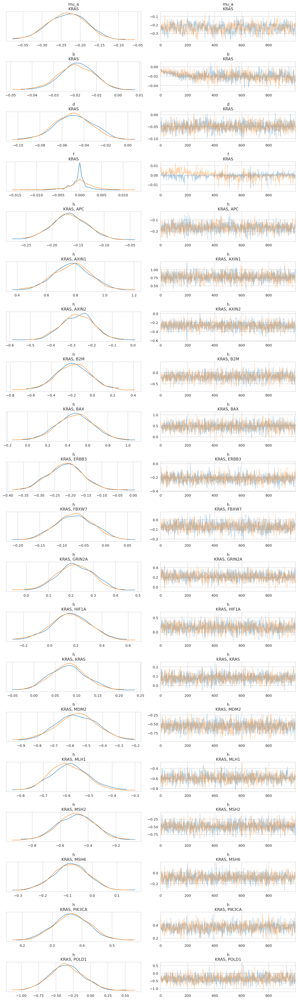

**APC**

/home/jc604/.conda/envs/speclet/lib/python3.10/site-packages/arviz/plots/traceplot.py:212: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (30), generating only 20 plots
  warnings.warn(


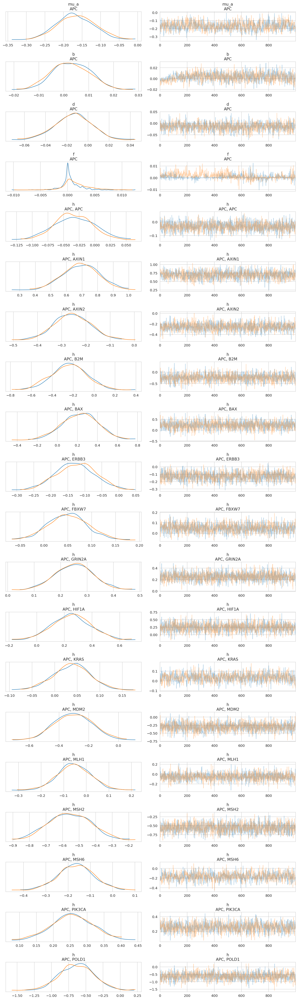

In [33]:
example_genes = ["KRAS", "APC"]
for gene in example_genes:
    _md_bold(gene)
    az.plot_trace(
        trace,
        var_names=["mu_a", "b", "d", "f", "h"],
        coords={"gene": [gene]},
        compact=False,
    )
    plt.tight_layout()
    plt.show()

**KRAS**

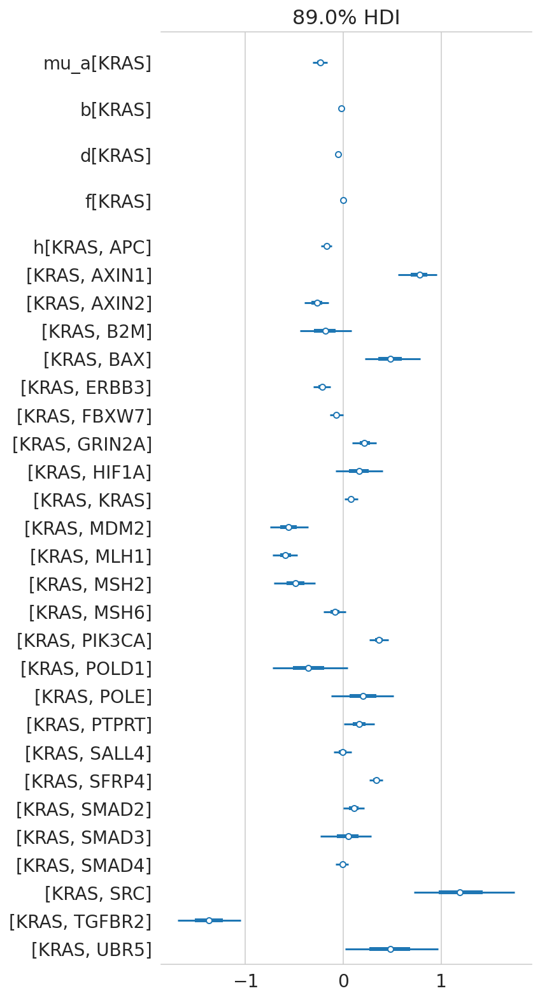

**APC**

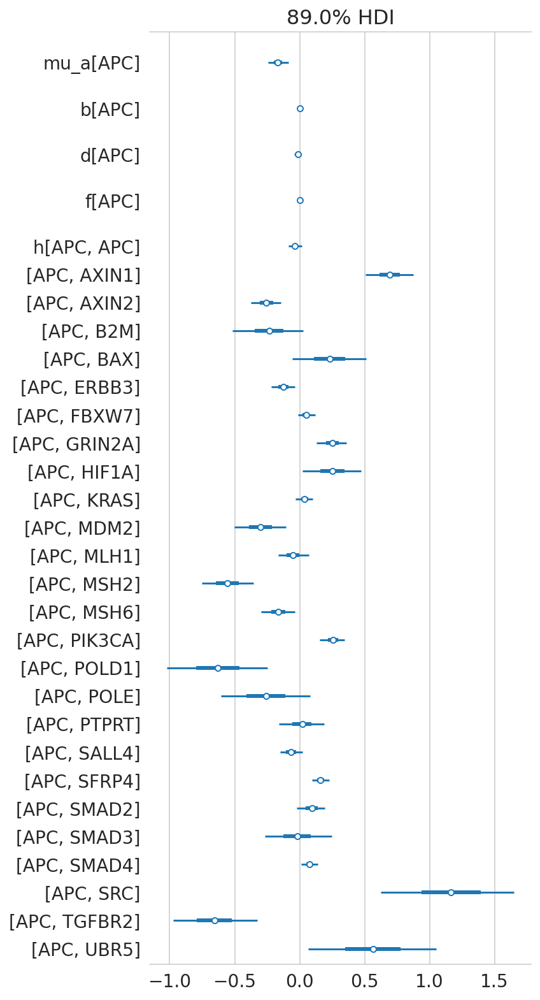

In [34]:
example_genes = ["KRAS", "APC"]
for gene in example_genes:
    _md_bold(gene)
    az.plot_forest(
        trace,
        var_names=["mu_a", "b", "d", "f", "h"],
        coords={"gene": [gene]},
        combined=True,
    )
    plt.tight_layout()
    plt.show()

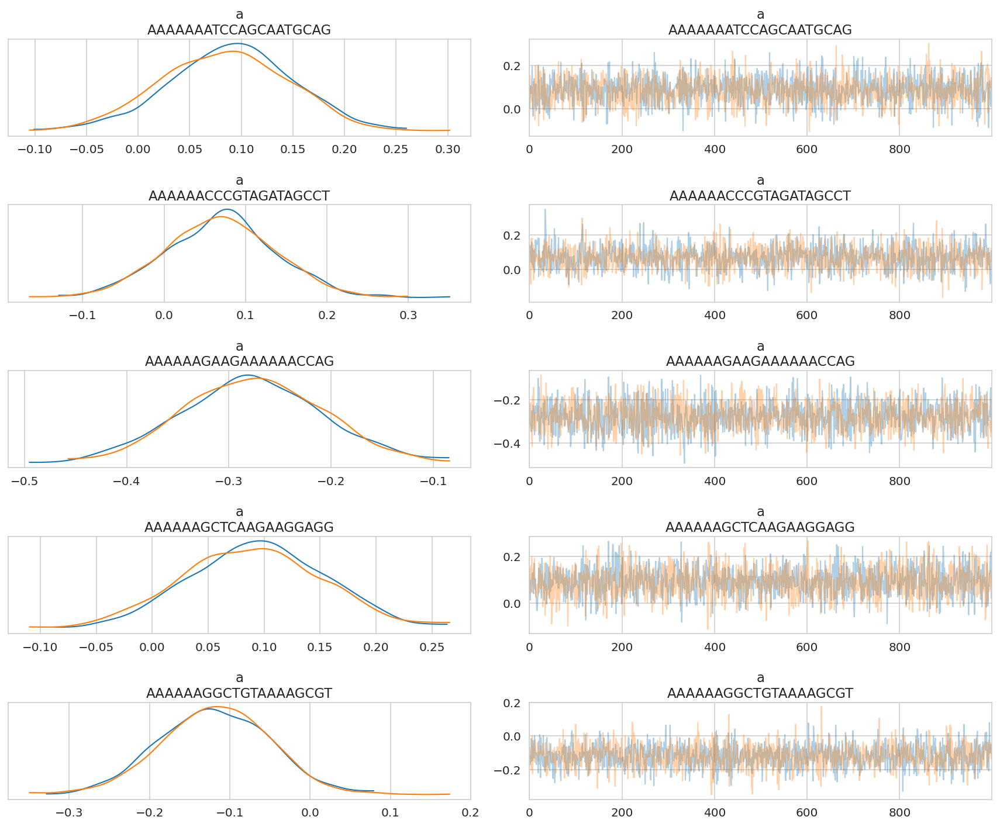

In [35]:
sgrnas_sample = trace.posterior.coords["sgrna"].values[:5]

az.plot_trace(trace, var_names="a", coords={"sgrna": sgrnas_sample}, compact=False)
plt.tight_layout()
plt.show()

In [36]:
az.summary(trace, var_names="a", coords={"sgrna": sgrnas_sample})

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a[AAAAAAATCCAGCAATGCAG],0.087,0.062,-0.008,0.187,0.002,0.001,1640.0,1530.0,1.0
a[AAAAAACCCGTAGATAGCCT],0.069,0.067,-0.035,0.181,0.002,0.001,1889.0,1644.0,1.0
a[AAAAAAGAAGAAAAAACCAG],-0.276,0.068,-0.378,-0.160,0.002,0.001,1843.0,1504.0,1.0
a[AAAAAAGCTCAAGAAGGAGG],0.092,0.062,0.002,0.201,0.001,0.001,1898.0,1604.0,1.0
a[AAAAAAGGCTGTAAAAGCGT],-0.118,0.068,-0.221,-0.011,0.002,0.001,1910.0,1449.0,1.0


In [37]:
crc_post_summary.filter_string("var_name", "^sigma_*")

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
3,sigma_a,0.164,0.034,0.104,0.185,0.017,0.013,6.0,11.0,1.85,sigma_a
5,sigma_mu_a,0.116,0.067,0.000,0.157,0.033,0.026,6.0,11.0,1.73,sigma_mu_a
6,sigma_b,0.006,0.004,0.000,0.010,0.002,0.001,5.0,17.0,2.09,sigma_b
7,sigma_d,0.018,0.010,0.000,0.024,0.005,0.004,6.0,11.0,1.66,sigma_d
8,sigma_f,0.002,0.002,0.000,0.005,0.001,0.001,7.0,20.0,1.58,sigma_f
9,sigma_h[APC],0.053,0.018,0.041,0.085,0.009,0.007,5.0,11.0,2.05,sigma_h
10,sigma_h[AXIN1],0.293,0.047,0.256,0.376,0.023,0.018,5.0,11.0,2.62,sigma_h
11,sigma_h[AXIN2],0.141,0.007,0.132,0.154,0.004,0.003,5.0,11.0,2.38,sigma_h
12,sigma_h[B2M],0.189,0.060,0.084,0.231,0.030,0.023,5.0,26.0,2.01,sigma_h
13,sigma_h[BAX],0.385,0.082,0.332,0.532,0.041,0.031,5.0,11.0,1.97,sigma_h


In [38]:
genes_var_names = ["mu_a", "b", "d", "f"]
genes_var_names += [f"h[{g}]" for g in trace.posterior.coords["cancer_gene"].values]
gene_corr_post = (
    az.summary(trace, "genes_chol_cov_corr", kind="stats")
    .pipe(extract_coords_param_names, names=["d1", "d2"])
    .astype({"d1": int, "d2": int})
    .assign(
        p1=lambda d: [genes_var_names[i] for i in d["d1"]],
        p2=lambda d: [genes_var_names[i] for i in d["d2"]],
    )
    .assign(
        p1=lambda d: pd.Categorical(d["p1"], categories=d["p1"].unique(), ordered=True)
    )
    .assign(
        p2=lambda d: pd.Categorical(
            d["p2"], categories=d["p1"].cat.categories, ordered=True
        )
    )
)
gene_corr_post

,mean,sd,hdi_5.5%,hdi_94.5%,d1,d2,p1,p2
"genes_chol_cov_corr[0, 0]",1.000,0.000,1.000,1.000,0,0,mu_a,mu_a
"genes_chol_cov_corr[0, 1]",0.476,0.085,0.366,0.597,0,1,mu_a,b
"genes_chol_cov_corr[0, 2]",-0.375,0.015,-0.399,-0.350,0,2,mu_a,d
"genes_chol_cov_corr[0, 3]",0.053,0.173,-0.228,0.318,0,3,mu_a,f
"genes_chol_cov_corr[0, 4]",-0.041,0.023,-0.076,-0.004,0,4,mu_a,h[APC]
...,...,...,...,...,...,...,...,...
"genes_chol_cov_corr[29, 25]",0.596,0.013,0.576,0.618,29,25,h[UBR5],h[SMAD3]
"genes_chol_cov_corr[29, 26]",-0.142,0.024,-0.182,-0.107,29,26,h[UBR5],h[SMAD4]
"genes_chol_cov_corr[29, 27]",0.285,0.019,0.256,0.318,29,27,h[UBR5],h[SRC]
"genes_chol_cov_corr[29, 28]",-0.111,0.018,-0.140,-0.084,29,28,h[UBR5],h[TGFBR2]


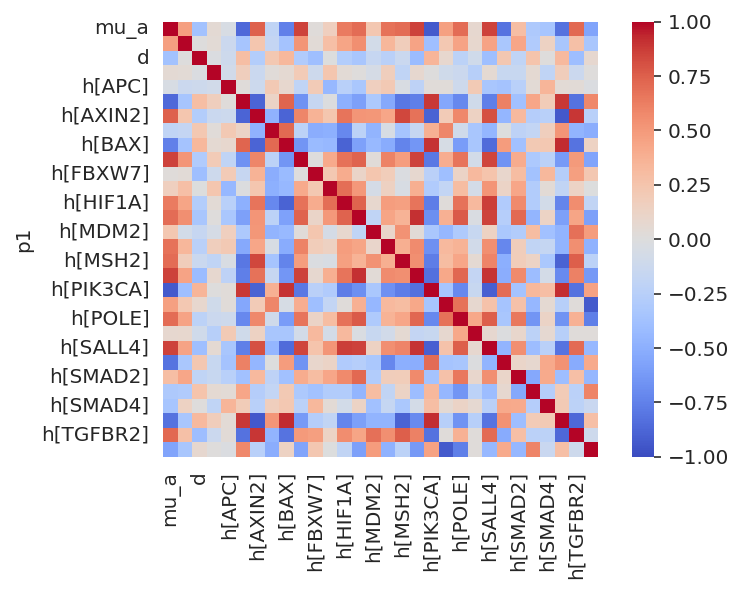

In [39]:
plot_df = gene_corr_post.pivot_wider("p1", "p2", "mean").set_index("p1")
sns.heatmap(plot_df, cmap="coolwarm", vmin=-1, vmax=1, square=True)
plt.show()

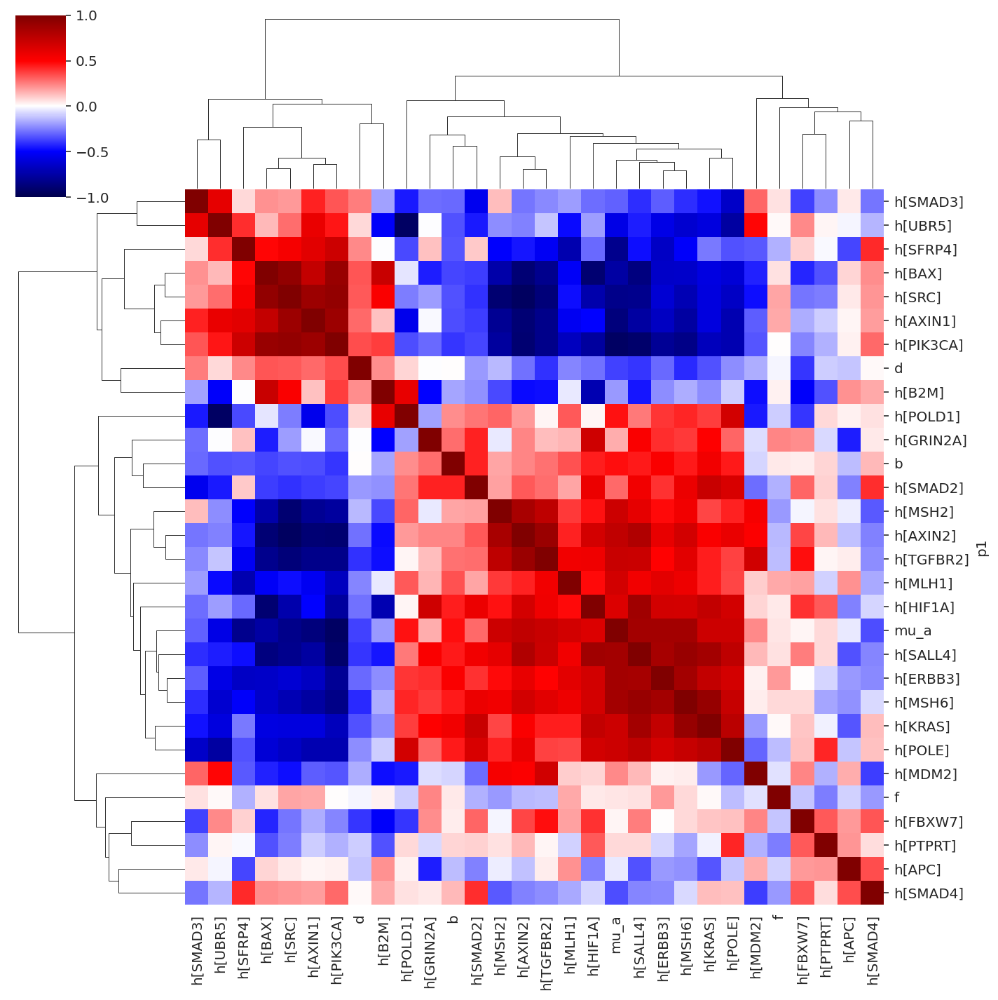

In [40]:
plot_df = gene_corr_post.pivot_wider("p1", "p2", "mean").set_index("p1")
sns.clustermap(plot_df, cmap="seismic", vmin=-1, vmax=1)
plt.show()

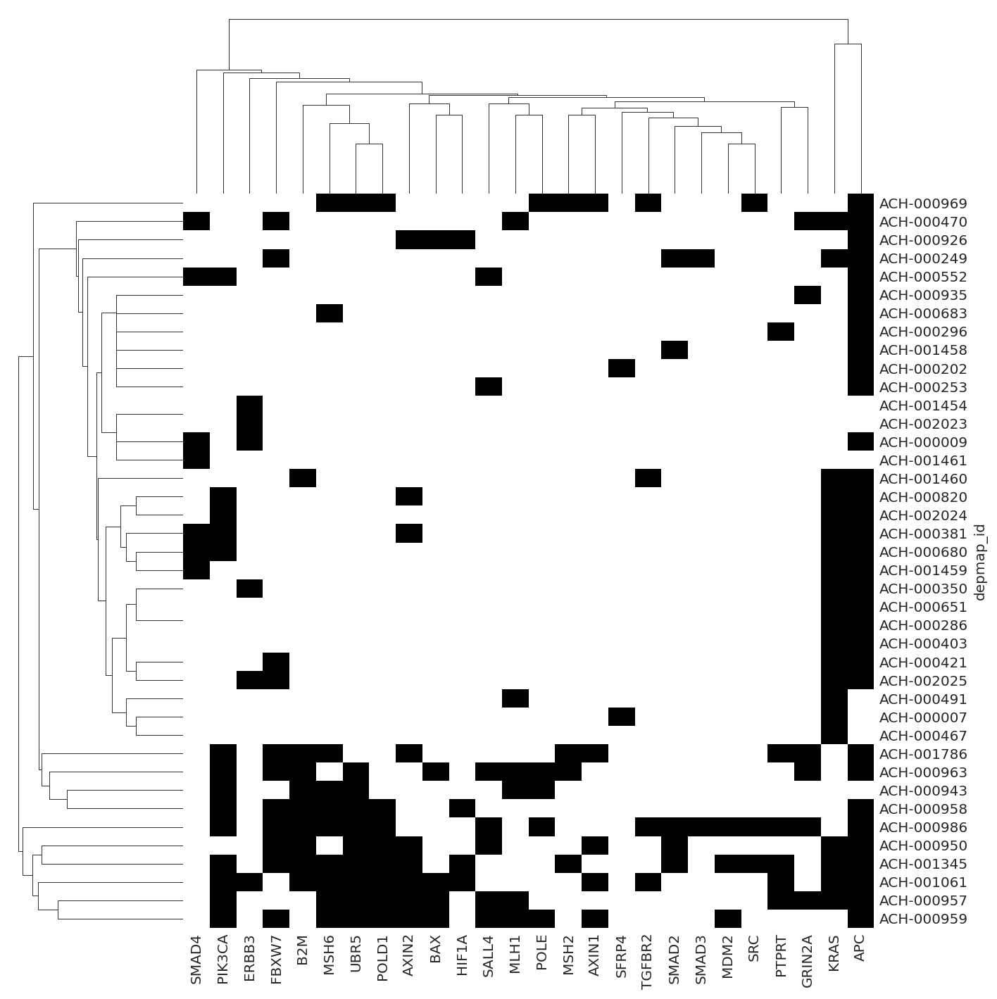

In [41]:
cancer_genes = trace.posterior.coords["cancer_gene"].values.tolist()
cancer_gene_mutants = (
    valid_crc_data.filter_column_isin("hugo_symbol", cancer_genes)[
        ["hugo_symbol", "depmap_id", "is_mutated"]
    ]
    .drop_duplicates()
    # .assign(is_mutated=lambda d: d["is_mutated"].map({True: "X", False: ""}))
    .pivot_wider("depmap_id", names_from="hugo_symbol", values_from="is_mutated")
    .set_index("depmap_id")
)
cg = sns.clustermap(cancer_gene_mutants, cmap="Greys", xticklabels=1, yticklabels=1)
cg.ax_heatmap.tick_params("both", length=0)
cg.ax_cbar.remove()
plt.show()

In [42]:
h_post_summary = (
    crc_post_summary.query("var_name == 'h'")
    .reset_index(drop=True)
    .pipe(
        extract_coords_param_names,
        names=["hugo_symbol", "cancer_gene"],
        col="parameter",
    )
)
h_post_summary.head()

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name,hugo_symbol,cancer_gene
0,"h[A1BG, APC]",0.014,0.029,-0.029,0.064,0.003,0.003,65.0,363.0,1.22,h,A1BG,APC
1,"h[A1BG, AXIN1]",-0.072,0.093,-0.236,0.053,0.017,0.012,28.0,167.0,1.18,h,A1BG,AXIN1
2,"h[A1BG, AXIN2]",0.038,0.062,-0.057,0.144,0.007,0.006,60.0,248.0,1.12,h,A1BG,AXIN2
3,"h[A1BG, B2M]",-0.046,0.138,-0.243,0.207,0.013,0.009,136.0,261.0,1.47,h,A1BG,B2M
4,"h[A1BG, BAX]",-0.150,0.162,-0.368,0.121,0.036,0.026,20.0,991.0,1.14,h,A1BG,BAX


In [43]:
h_post_summary.sort_values("mean").pipe(head_tail, n=5)

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name,hugo_symbol,cancer_gene
432760,"h[TXNL4A, POLE]",-2.928,0.897,-4.486,-2.116,0.437,0.338,6.0,25.0,1.78,h,TXNL4A,POLE
328708,"h[RAN, POLE]",-2.925,0.923,-4.555,-2.133,0.450,0.347,6.0,17.0,1.77,h,RAN,POLE
115144,"h[DUX4, POLE]",-2.884,0.713,-4.134,-2.196,0.342,0.265,6.0,22.0,1.76,h,DUX4,POLE
346362,"h[RRM1, POLE]",-2.682,0.901,-4.245,-1.931,0.439,0.340,7.0,31.0,1.60,h,RRM1,POLE
43280,"h[BUB3, POLE]",-2.602,0.746,-3.921,-1.938,0.360,0.279,7.0,13.0,1.56,h,BUB3,POLE
432767,"h[TXNL4A, SRC]",3.557,0.652,2.831,4.608,0.295,0.229,6.0,32.0,1.71,h,TXNL4A,SRC
328717,"h[RAN, UBR5]",3.563,0.283,3.090,4.008,0.032,0.023,88.0,376.0,1.19,h,RAN,UBR5
345485,"h[RPS3A, SRC]",3.607,0.598,2.922,4.557,0.265,0.205,6.0,12.0,1.70,h,RPS3A,SRC
328715,"h[RAN, SRC]",3.634,0.722,2.855,4.854,0.334,0.259,6.0,15.0,1.85,h,RAN,SRC
345927,"h[RPSA, SRC]",3.696,0.643,3.027,4.811,0.296,0.229,7.0,41.0,1.62,h,RPSA,SRC


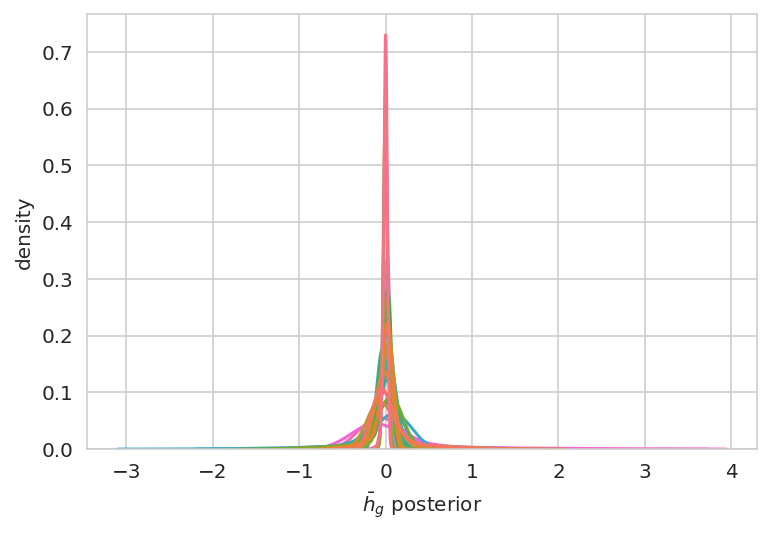

In [50]:
ax = sns.kdeplot(data=h_post_summary, x="mean", hue="cancer_gene")
ax.set_xlabel(r"$\bar{h}_g$ posterior")
ax.set_ylabel("density")
ax.get_legend().remove()  # set_title("cancer gene\ncomut.")
plt.show()

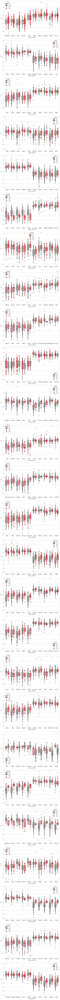

In [58]:
fig, axes = plt.subplots(
    len(cancer_genes), 1, squeeze=False, figsize=(8, len(cancer_genes) * 5)
)
for ax, cg in zip(axes.flatten(), cancer_genes):
    h_hits = (
        h_post_summary.filter_column_isin("cancer_gene", [cg])
        .sort_values("mean")
        .pipe(head_tail, n=5)["hugo_symbol"]
        .tolist()
    )

    h_hits_data = (
        valid_crc_data.filter_column_isin("hugo_symbol", h_hits)
        .merge(cancer_gene_mutants.reset_index(), on="depmap_id")
        .reset_index()
        .astype({"hugo_symbol": str})
        .assign(
            hugo_symbol=lambda d: pd.Categorical(d["hugo_symbol"], categories=h_hits),
            _cg_mut=lambda d: d[cg].map({True: "mut.", False: "WT"}),
        )
    )
    mut_pal = {"mut.": "tab:red", "WT": "gray"}
    sns.boxplot(
        data=h_hits_data,
        x="hugo_symbol",
        y="lfc",
        hue="_cg_mut",
        palette=mut_pal,
        ax=ax,
        showfliers=False,
        boxprops={"alpha": 0.5},
    )
    sns.stripplot(
        data=h_hits_data,
        x="hugo_symbol",
        y="lfc",
        hue="_cg_mut",
        dodge=True,
        palette=mut_pal,
        ax=ax,
    )
    ax.get_legend().set_title(cg)

plt.tight_layout()
plt.show()

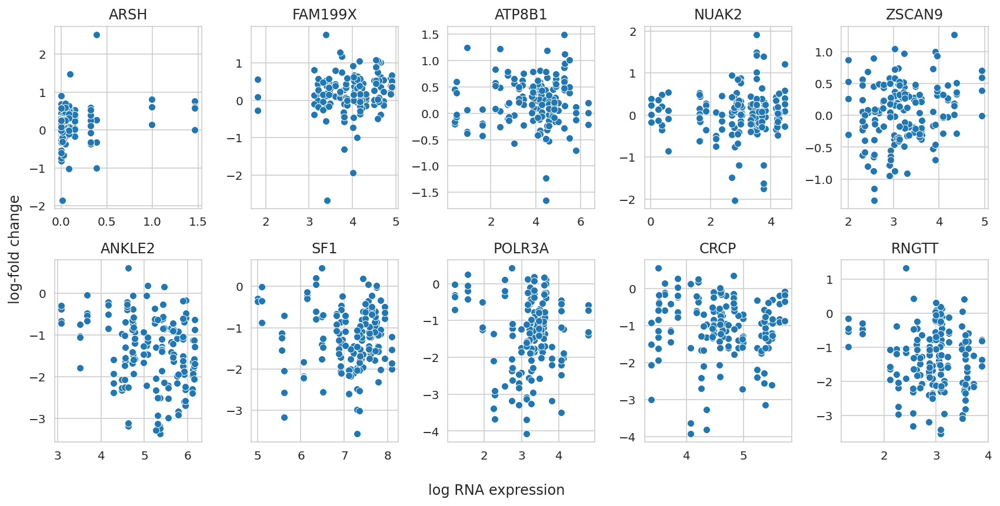

In [59]:
top_n = 5
top_b_hits = (
    crc_post_summary.query("var_name == 'b'")
    .sort_values("mean")
    .reset_index(drop=True)
    .pipe(extract_coords_param_names, names=["hugo_symbol"], col="parameter")
    .pipe(head_tail, n=top_n)
)

negative_b = top_b_hits["hugo_symbol"][:top_n].values
positive_b = top_b_hits["hugo_symbol"][top_n:].values


fig, axes = plt.subplots(2, top_n, figsize=(12, 6))

for i, genes in enumerate([positive_b, negative_b]):
    for j, gene in enumerate(genes):
        ax = axes[i, j]
        ax.set_title(gene)
        obs_data = crc_data.query(f"hugo_symbol == '{gene}'")
        sns.scatterplot(data=obs_data, x="rna_expr", y="lfc", ax=ax)
        ax.set_xlabel(None)
        ax.set_ylabel(None)


fig.supxlabel("log RNA expression")
fig.supylabel("log-fold change")

fig.tight_layout()
plt.show()

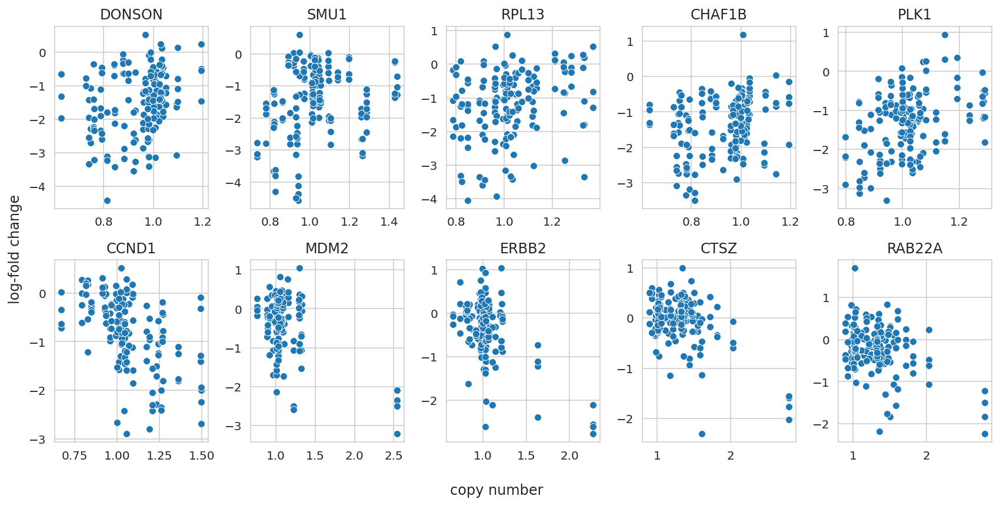

In [60]:
top_n = 5
top_d_hits = (
    crc_post_summary.query("var_name == 'd'")
    .sort_values("mean")
    .reset_index(drop=True)
    .pipe(extract_coords_param_names, names=["hugo_symbol"], col="parameter")
    .pipe(head_tail, n=top_n)
)

negative_d = top_d_hits["hugo_symbol"][:top_n].values
positive_d = top_d_hits["hugo_symbol"][top_n:].values


fig, axes = plt.subplots(2, top_n, figsize=(12, 6))

for i, genes in enumerate([positive_d, negative_d]):
    for j, gene in enumerate(genes):
        ax = axes[i, j]
        ax.set_title(gene)
        obs_data = crc_data.query(f"hugo_symbol == '{gene}'")
        sns.scatterplot(data=obs_data, x="copy_number", y="lfc", ax=ax)
        ax.set_xlabel(None)
        ax.set_ylabel(None)


fig.supxlabel("copy number")
fig.supylabel("log-fold change")
fig.tight_layout()
plt.show()

## PPC

In [61]:
np.random.seed(99)
n_examples = 40
n_chains, n_draws, n_data = trace.posterior_predictive["ct_final"].shape
ex_draws_idx = np.random.choice(
    np.arange(n_draws), size=n_examples // n_chains, replace=False
)
example_ppc_draws = trace.posterior_predictive["ct_final"][
    :, ex_draws_idx, :
].values.reshape(-1, n_data)
example_ppc_draws.shape

(40, 2842455)

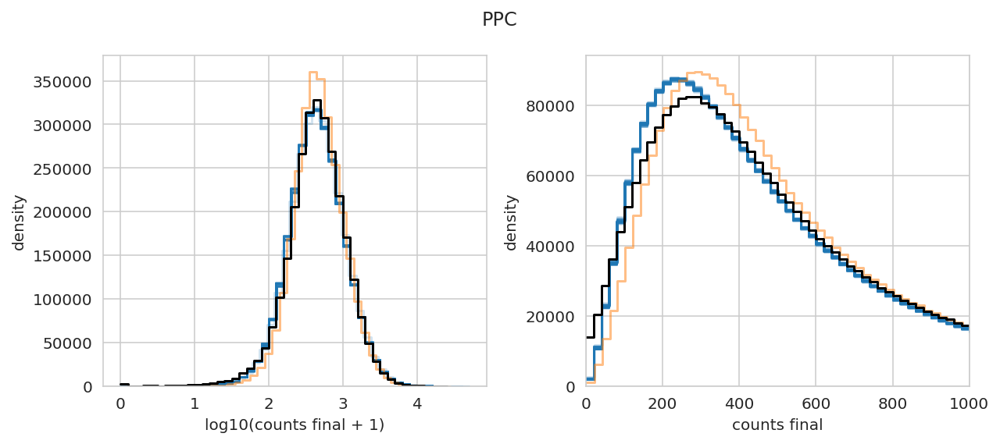

In [62]:
fig, axes = plt.subplots(ncols=2, figsize=(9, 4), sharex=False, sharey=False)
ax1 = axes[0]
ax2 = axes[1]
hist_kwargs = {"stat": "count", "element": "step", "fill": False}

pp_avg = trace.posterior_predictive["ct_final"].mean(axis=(0, 1))

bw = 0.1
for i in range(example_ppc_draws.shape[0]):
    sns.histplot(
        x=np.log10(example_ppc_draws[i, :] + 1),
        alpha=0.2,
        binwidth=bw,
        color="tab:blue",
        ax=ax1,
        **hist_kwargs,
    )

sns.histplot(
    x=np.log10(pp_avg + 1),
    color="tab:orange",
    binwidth=bw,
    ax=ax1,
    alpha=0.5,
    **hist_kwargs,
)
sns.histplot(
    x=np.log10(valid_crc_data["counts_final"] + 1),
    color="k",
    binwidth=bw,
    ax=ax1,
    **hist_kwargs,
)
ax1.set_xlabel("log10(counts final + 1)")
ax1.set_ylabel("density")

bw = 20
for i in range(example_ppc_draws.shape[0]):
    sns.histplot(
        x=example_ppc_draws[i, :],
        alpha=0.2,
        binwidth=bw,
        color="tab:blue",
        ax=ax2,
        **hist_kwargs,
    )

sns.histplot(
    x=pp_avg, color="tab:orange", alpha=0.5, ax=ax2, binwidth=bw, **hist_kwargs
)
sns.histplot(
    x=valid_crc_data["counts_final"], color="k", binwidth=bw, ax=ax2, **hist_kwargs
)
ax2.set_xlabel("counts final")
ax2.set_ylabel("density")
ax2.set_xlim(0, 1000)

fig.suptitle("PPC")
fig.tight_layout()
plt.show()

---

## Session info

In [63]:
notebook_toc = time()
print(f"execution time: {(notebook_toc - notebook_tic) / 60:.2f} minutes")

execution time: 25.27 minutes


In [64]:
%load_ext watermark
%watermark -d -u -v -iv -b -h -m

Last updated: 2022-08-01

Python implementation: CPython
Python version       : 3.10.5
IPython version      : 8.4.0

Compiler    : GCC 10.3.0
OS          : Linux
Release     : 3.10.0-1160.45.1.el7.x86_64
Machine     : x86_64
Processor   : x86_64
CPU cores   : 28
Architecture: 64bit

Hostname: compute-e-16-236.o2.rc.hms.harvard.edu

Git branch: simplify

matplotlib: 3.5.2
pandas    : 1.4.3
arviz     : 0.12.1
numpy     : 1.22.4
seaborn   : 0.11.2

